In [1]:
# Importing all the required Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import pickle
from sklearn import metrics
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV

In [3]:
# importing the data frame

In [4]:
df=pd.read_csv('D:\\python\\Real_Combine.csv')

In [5]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [6]:
# Shape of the data 

In [7]:
df.shape

(1093, 9)

In [8]:
# checking for null values

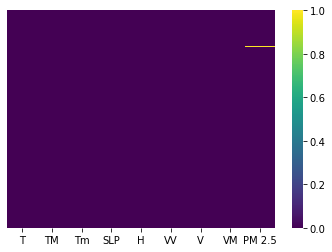

In [9]:
sns.heatmap(df.isnull(),yticklabels=False,cmap='viridis')

In [10]:
# there is only one null value in PM2.5

In [11]:
df.isnull().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

In [12]:
# droping the null value

In [13]:
df=df.dropna()

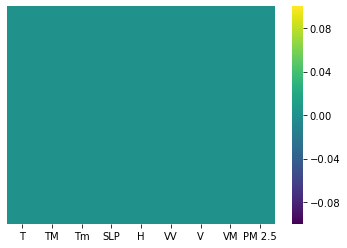

In [14]:
sns.heatmap(df.isnull(),yticklabels=False,cmap='viridis')

In [15]:
# Stastical describtio for data

In [16]:
df.describe()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
count,1092.000000,1092.000000,1092.000000,1092.000000,1092.000000,1092.000000,1092.000000,1092.000000,1092.000000
mean,26.019963,32.494414,19.468040,1008.070513,62.892857,2.003480,6.753297,15.809432,109.090984
std,7.232026,6.670017,7.437543,7.523290,15.693982,0.747784,3.842442,7.310394,84.465790
min,6.700000,9.800000,0.000000,991.500000,20.000000,0.300000,0.400000,1.900000,0.000000
25%,19.300000,27.800000,12.100000,1001.100000,54.000000,1.600000,3.700000,11.100000,41.833333
50%,28.200000,34.250000,21.200000,1008.050000,64.000000,1.900000,6.500000,14.800000,83.458333
75%,31.700000,37.000000,26.000000,1015.000000,74.000000,2.600000,9.100000,18.300000,158.291667
max,38.500000,45.500000,32.700000,1023.200000,98.000000,5.800000,24.400000,57.600000,404.500000


In [17]:
# spliting into dependent and independent feature

In [18]:
x=df.iloc[:,:-1] #independent features
y=df.iloc[:,-1] #dependent features

In [19]:
print('sahpe of independent features',x.shape)
print()
print('shape of dependent feature',y.shape)

sahpe of independent features (1092, 8)

shape of dependent feature (1092,)


In [20]:
# Density Distribution for Each feature

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000012032CA7E48>,
      dtype=object)

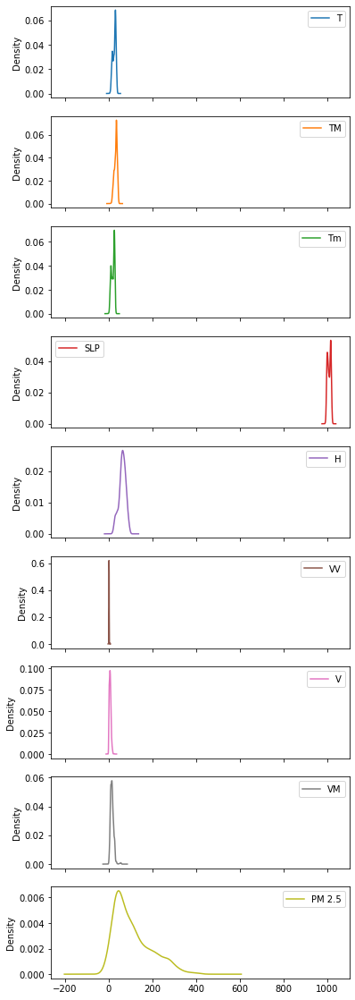

In [21]:
df.plot(kind='kde',subplots=True,figsize=(6,20),sharex=True)

In [22]:
# As we can see that PM2.5 is highly  right skewed

In [23]:
# SlP has all positive value

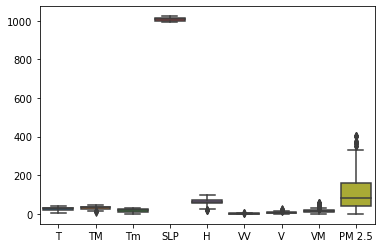

In [24]:
sns.boxplot(data=df)

In [25]:
# As we can see here pm2.5 is highly right skwed

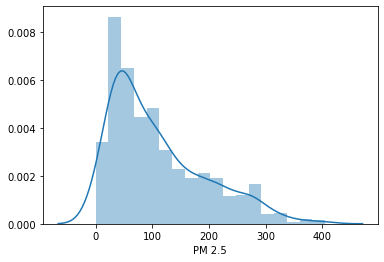

In [26]:
sns.distplot(y)

In [27]:
# scatter plot of the data 
# as we can see here TM and T is linearly corelated Tm and T is also linearly corelated and TM and tm is also linearly corelated
# SLP is inversely corelated with T,Tm and TM

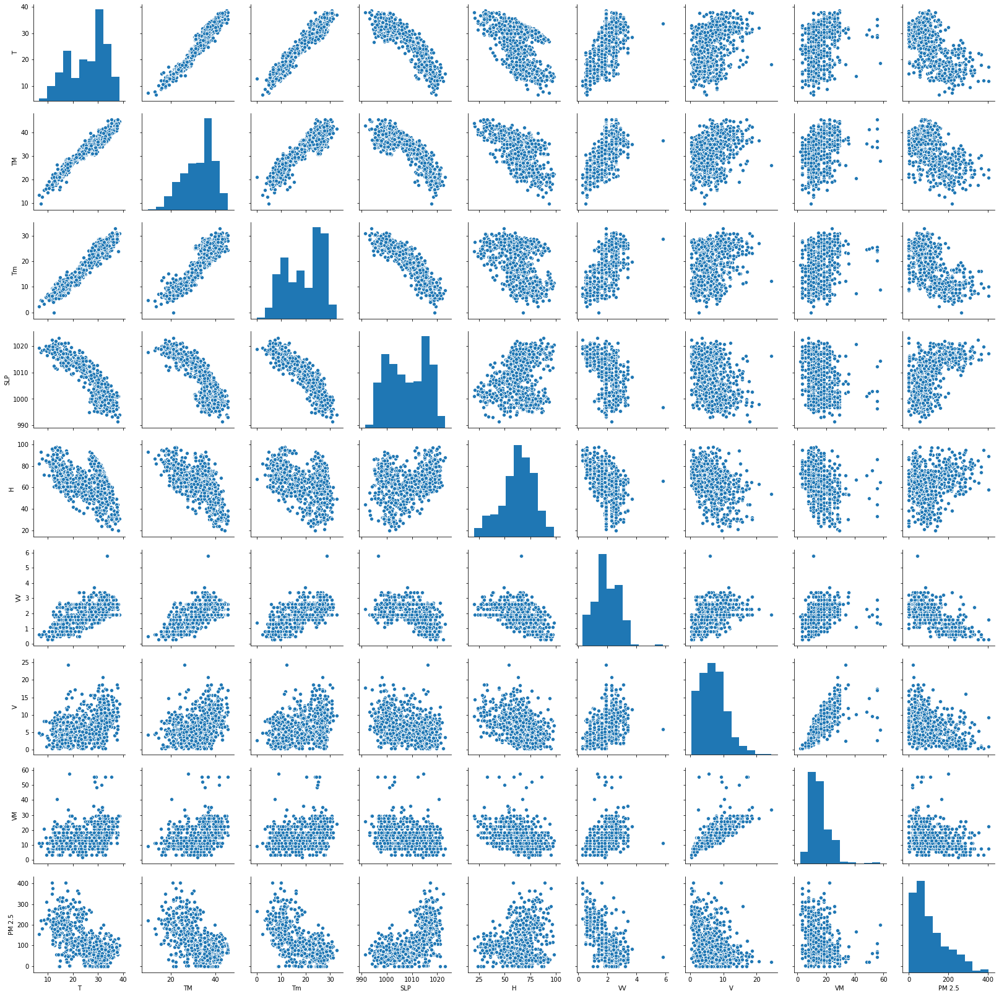

In [28]:
sns.pairplot(df)

In [29]:
# as we can numerical corelation strength b/w the features

In [30]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


In [31]:
# corelation matrix with heatmap

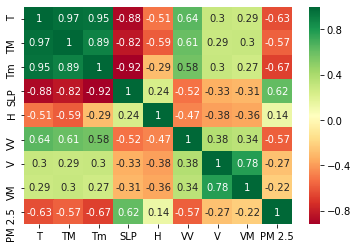

In [32]:
cormat=df.corr()
top_corr_features=cormat.index
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap='RdYlGn')

In [33]:
# Feature Importance

# feature importance will give the importance of each feature in the dataset
# It will give the score of each feature. Higher the score of feature more important and relevant the feature is for data
# we will use Extra tree regressor for extracting the top 10 feature for the dataset

In [34]:
model = ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [35]:
print(model.feature_importances_)

[0.18302406 0.09636091 0.17232395 0.16404264 0.0880009  0.19956828
 0.05519029 0.04148897]


In [36]:
x.columns

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM'], dtype='object')

In [37]:
# plotting the graph for feature importance

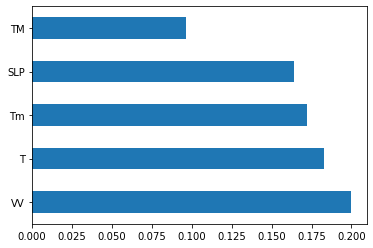

In [38]:
feat_importance=pd.Series(model.feature_importances_,index=x.columns)
feat_importance.nlargest(5).plot(kind='barh')
plt.show()

In [39]:
# Train Test Split

In [40]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [41]:
# shape of train data

In [42]:
x_train.shape,y_train.shape

((764, 8), (764,))

In [43]:
# shape of test data

In [44]:
x_test.shape,y_test.shape

((328, 8), (328,))

In [45]:
# applying decision tree

In [46]:
from sklearn.tree import DecisionTreeRegressor

In [47]:
dtree=DecisionTreeRegressor(criterion='mse')

In [48]:
dtree.fit(x_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [49]:
# checking accuracy on train data

In [50]:
dtree.score(x_train,y_train)

1.0

In [51]:
# checking accuracy on test data

In [52]:
dtree.score(x_test,y_test)

0.68150462206254

In [53]:
# there is a lot of differnce in train and test data accuracy 
# By which we can think of the case overfitting

In [54]:
# Applying the cross val score

In [55]:
score=cross_val_score(dtree,x,y,cv=5)

In [56]:
score

array([ 0.14473088, -0.57538021,  0.67042768,  1.        ,  1.        ])

In [57]:
score.mean()

0.4479556690674326

In [58]:
score.std()

0.5996934673771882

In [59]:
# Tree visualization

In [60]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

C:\Users\Rageshwar\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [61]:
features=list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [62]:
dot_data=StringIO()
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.940661 to fit



In [63]:
# plotting the distribution graph

In [64]:
predict=dtree.predict(x_test)

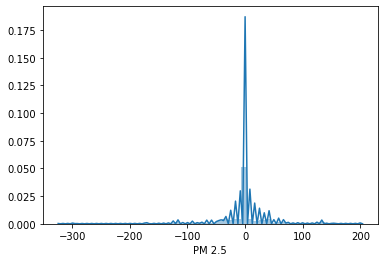

In [65]:
sns.distplot(y_test-predict)

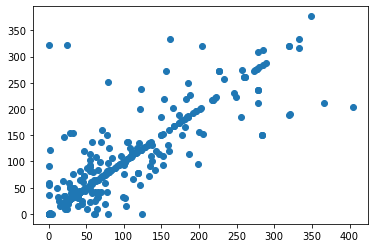

In [66]:
plt.scatter(y_test,predict)

In [67]:
# performing hyperparameter tunning for Decision Tree Regressor

In [68]:
DecisionTreeRegressor()

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [86]:
para={'ccp_alpha' : [0.0], 
    'criterion' : ["mse", "friedman_mse", "mae"],
     'splitter' : ['best','random'],
      'max_depth' : [3,4,5,7,9,10,12,15],
     }

In [87]:
# Applying the Grid Search CV

In [88]:
Grid_search=GridSearchCV(dtree,param_grid=para,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [89]:

Grid_search.fit(x,y)

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:   14.9s finished


GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ccp_alpha': [0.0],
                         'criterion': ['mse', 'friedman_mse', 'mae'],
                         'max_depth': [3,

In [ ]:
# best parameters

In [90]:
Grid_search.best_params_

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'max_depth': 12,
 'splitter': 'random'}

In [91]:
Grid_search.best_score_

-2096.6511209701953

In [92]:
# prediction 

In [93]:
predictions=Grid_search.predict(x_test)

In [ ]:
# now afer hyper parameter tunning we can see that distribution is so controlled

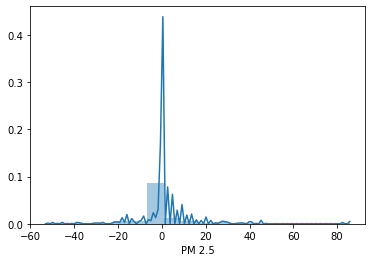

In [94]:
sns.distplot(y_test-predictions)

In [95]:
# model evaluation

In [97]:
print('MAE',metrics.mean_absolute_error(y_test,predictions))
print('MSE',metrics.mean_absolute_error(y_test,predictions))
print('RMSE',np.sqrt(metrics.mean_absolute_error(y_test,predictions)))

MAE 5.8373992844549445
MSE 5.8373992844549445
RMSE 2.4160710429238095


In [98]:
# saving the model

In [99]:
# open the file where we want to store the data
file=open('D:\\python\\dtree.pkl','wb')

# dump info to file
pickle.dump(dtree,file)